# Testing the synthetic dataset
In this notebook we will try the new synthetic dataset created from the diabetic dataset.

In [1]:
from mlxtend.plotting import plot_decision_regions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
real_data = pd.read_csv('../data/diabetes.csv')

real_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [3]:
synth_data = pd.read_csv('../data/diabetes_synth.csv', index_col=0)

synth_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,1,96,68,15,45,30.3,0.429,36,1
1,11,93,75,44,222,31.3,0.425,34,0
2,1,110,50,29,296,36.1,0.128,38,0
3,0,159,74,23,169,44.4,0.448,26,0
4,0,149,76,31,293,26.9,0.831,34,0


## Basic Data Science and ML Pipeline¶

### OSEMN Pipeline

O - Obtaining our data \
S - Scrubbing / Cleaning our data \
E - Exploring / Visualizing our data will allow us to find patterns and trends \
M - Modeling our data will give us our predictive power as a wizard \
N - INterpreting our data \

## Basic EDA and statistical analysis

In [4]:
real_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
synth_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 60.0 KB


In [6]:
real_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [7]:
synth_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,2.397135,3.066383,0.000,0.00000,1.000,4.0000,17.000
Glucose,768.0,121.251302,30.776998,44.000,99.00000,118.500,142.0000,199.000
BloodPressure,768.0,71.444010,12.841202,34.000,62.00000,71.000,80.0000,112.000
SkinThickness,768.0,29.278646,10.733246,8.000,21.00000,28.000,36.0000,82.000
Insulin,768.0,160.888021,106.918217,15.000,78.00000,139.000,224.0000,588.000
BMI,768.0,32.663542,7.071757,15.000,27.70000,32.300,37.6000,56.200
DiabetesPedigreeFunction,768.0,0.454172,0.290660,0.083,0.22475,0.391,0.5995,1.586
Age,768.0,34.678385,12.702162,21.000,24.00000,31.000,42.0000,78.000
Outcome,768.0,0.356771,0.479359,0.000,0.00000,0.000,1.0000,1.000


In [8]:
real_data_copy = real_data.copy(deep=True)
synth_data_copy = synth_data.copy(deep=True)

real_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = real_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

synth_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = synth_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

In [9]:
print(real_data_copy.isnull().sum())

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64


In [10]:
print(synth_data_copy.isnull().sum())

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


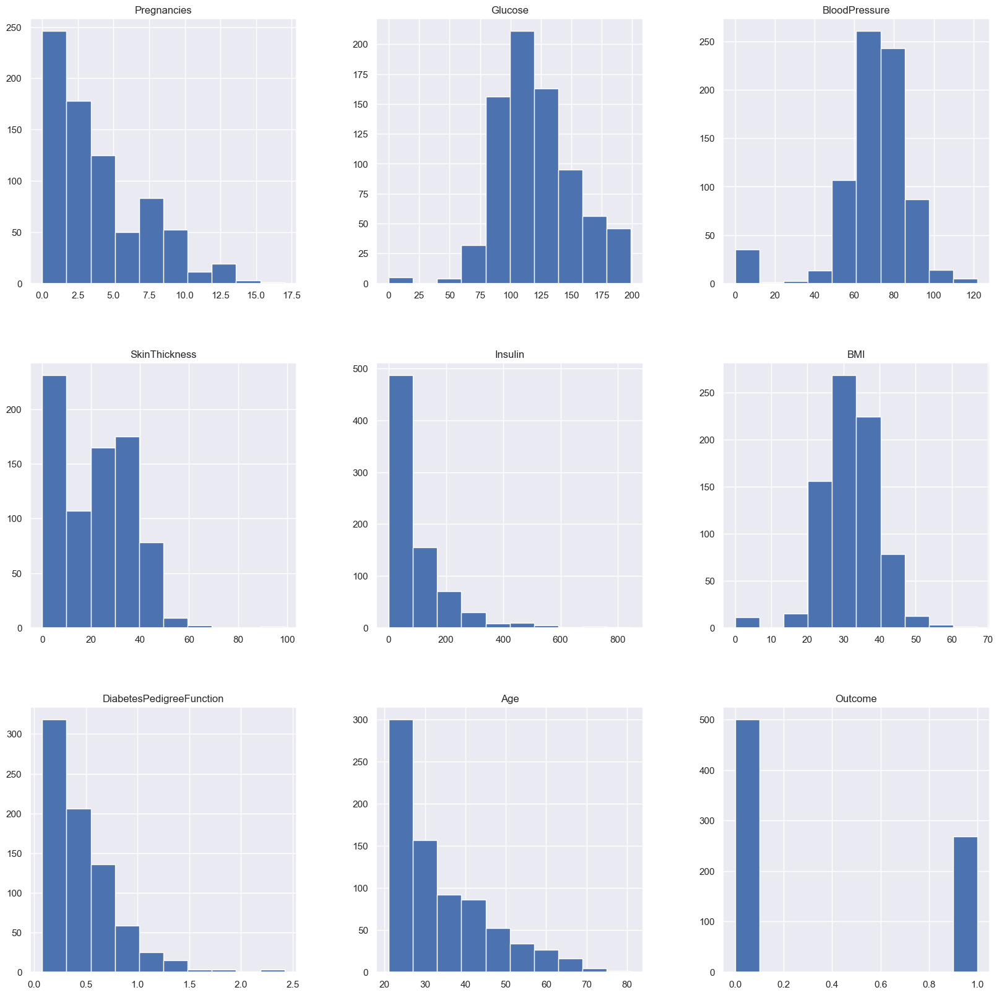

In [11]:
p = real_data.hist(figsize = (20,20))

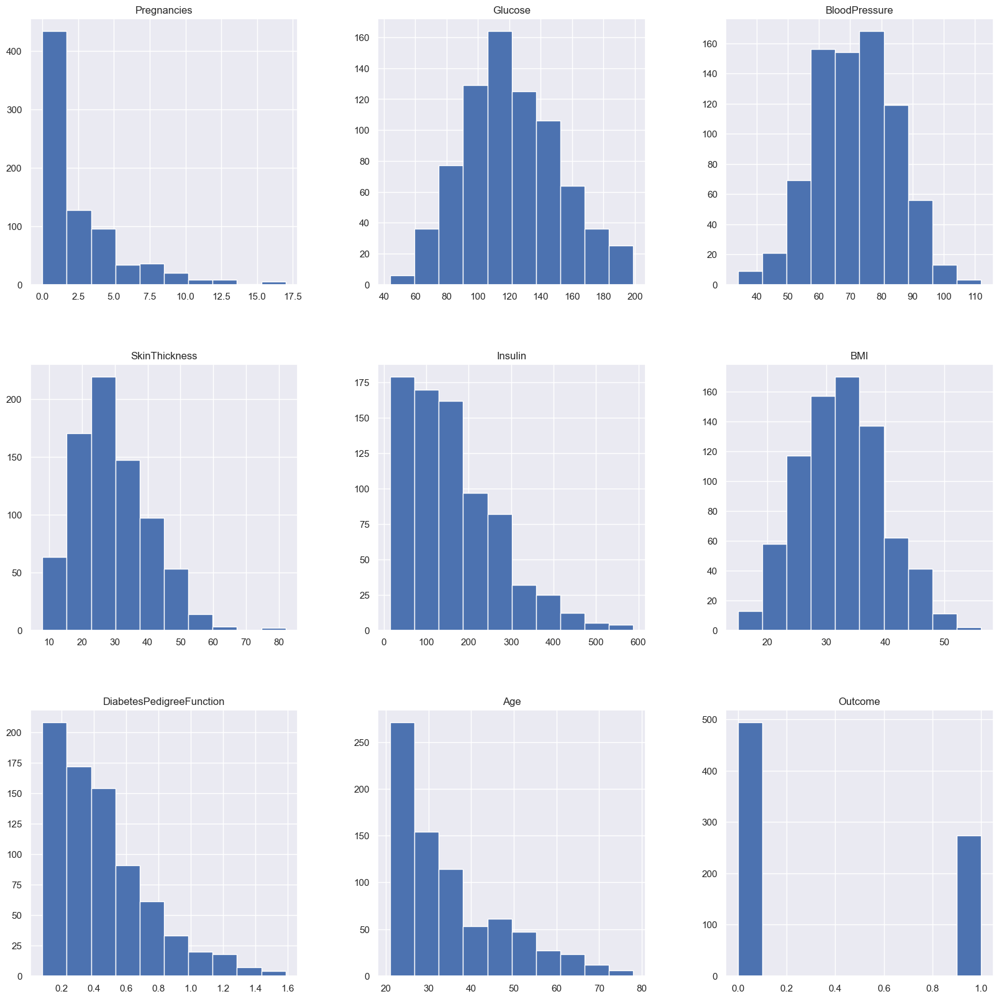

In [12]:
q = synth_data.hist(figsize = (20,20))

In [13]:
real_data_copy['Glucose'].fillna(real_data_copy['Glucose'].mean(), inplace = True)
real_data_copy['BloodPressure'].fillna(real_data_copy['BloodPressure'].mean(), inplace = True)
real_data_copy['SkinThickness'].fillna(real_data_copy['SkinThickness'].median(), inplace = True)
real_data_copy['Insulin'].fillna(real_data_copy['Insulin'].median(), inplace = True)
real_data_copy['BMI'].fillna(real_data_copy['BMI'].median(), inplace = True)

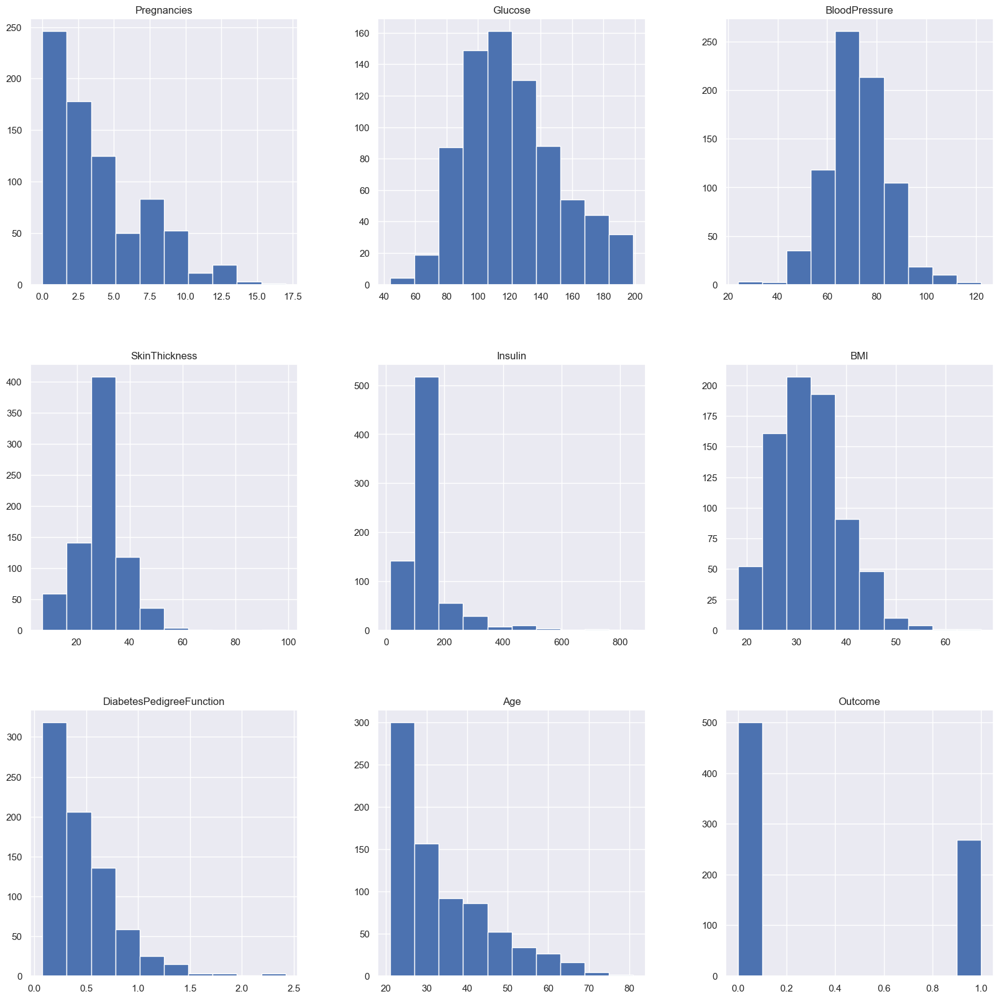

In [14]:
p = real_data_copy.hist(figsize = (20,20))

In [15]:
real_data.shape

(768, 9)

In [16]:
synth_data.shape

(768, 9)

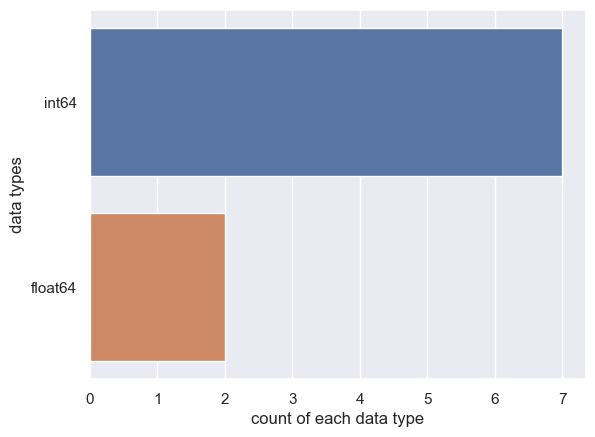

In [17]:
sns.countplot(y=real_data.dtypes ,data=real_data)
plt.xlabel("count of each data type")
plt.ylabel("data types")
plt.show()

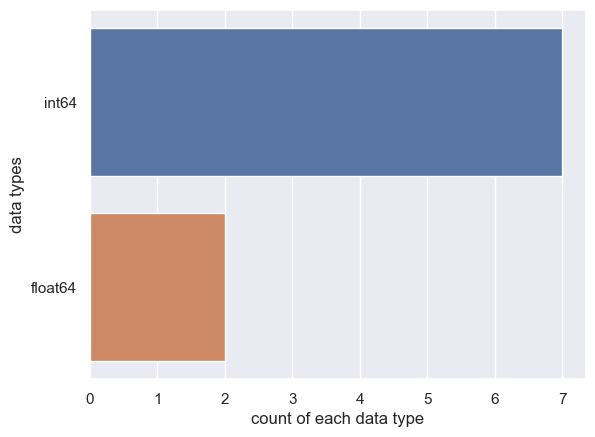

In [18]:
sns.countplot(y=synth_data.dtypes ,data=synth_data)
plt.xlabel("count of each data type")
plt.ylabel("data types")
plt.show()

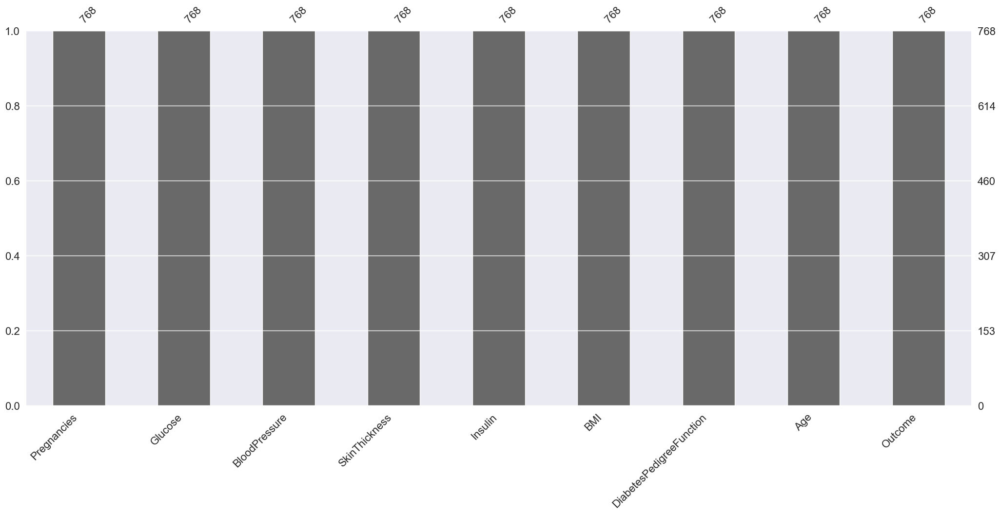

In [19]:
import missingno as msno
p=msno.bar(real_data)

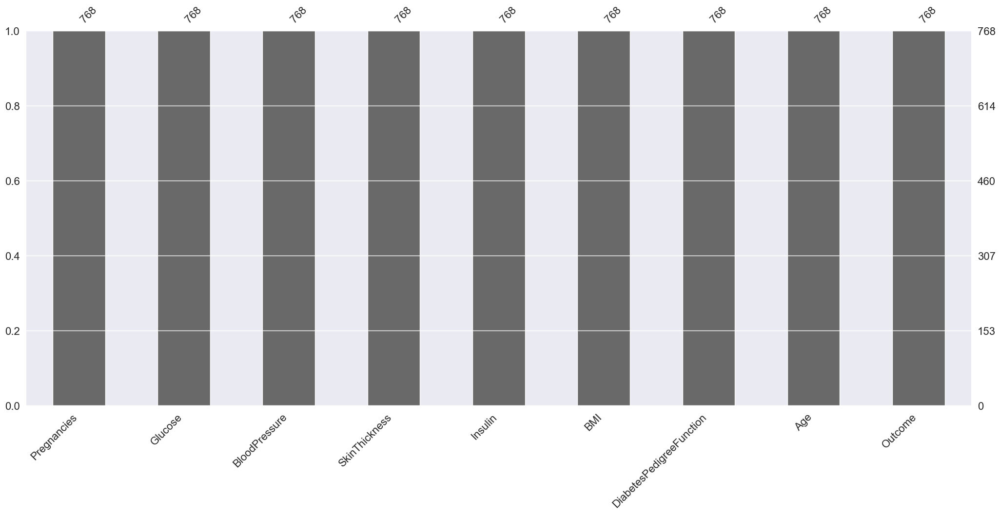

In [20]:
import missingno as msno
q=msno.bar(synth_data)

Outcome
0    500
1    268
Name: count, dtype: int64


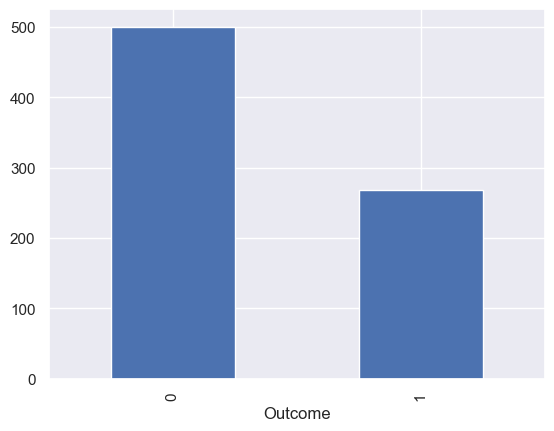

In [21]:
## checking the balance of the data by plotting the count of outcomes by their value
color_wheel = {1: "#0392cf", 
               2: "#7bc043"}
colors = real_data["Outcome"].map(lambda x: color_wheel.get(x + 1))
print(real_data.Outcome.value_counts())
r=real_data.Outcome.value_counts().plot(kind="bar")

Outcome
0    494
1    274
Name: count, dtype: int64


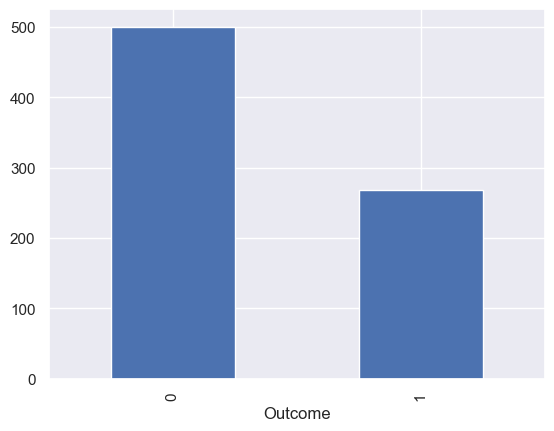

In [22]:
## checking the balance of the data by plotting the count of outcomes by their value
color_wheel = {1: "#0392cf", 
               2: "#7bc043"}
colors = synth_data["Outcome"].map(lambda x: color_wheel.get(x + 1))
print(synth_data.Outcome.value_counts())
s=real_data.Outcome.value_counts().plot(kind="bar")

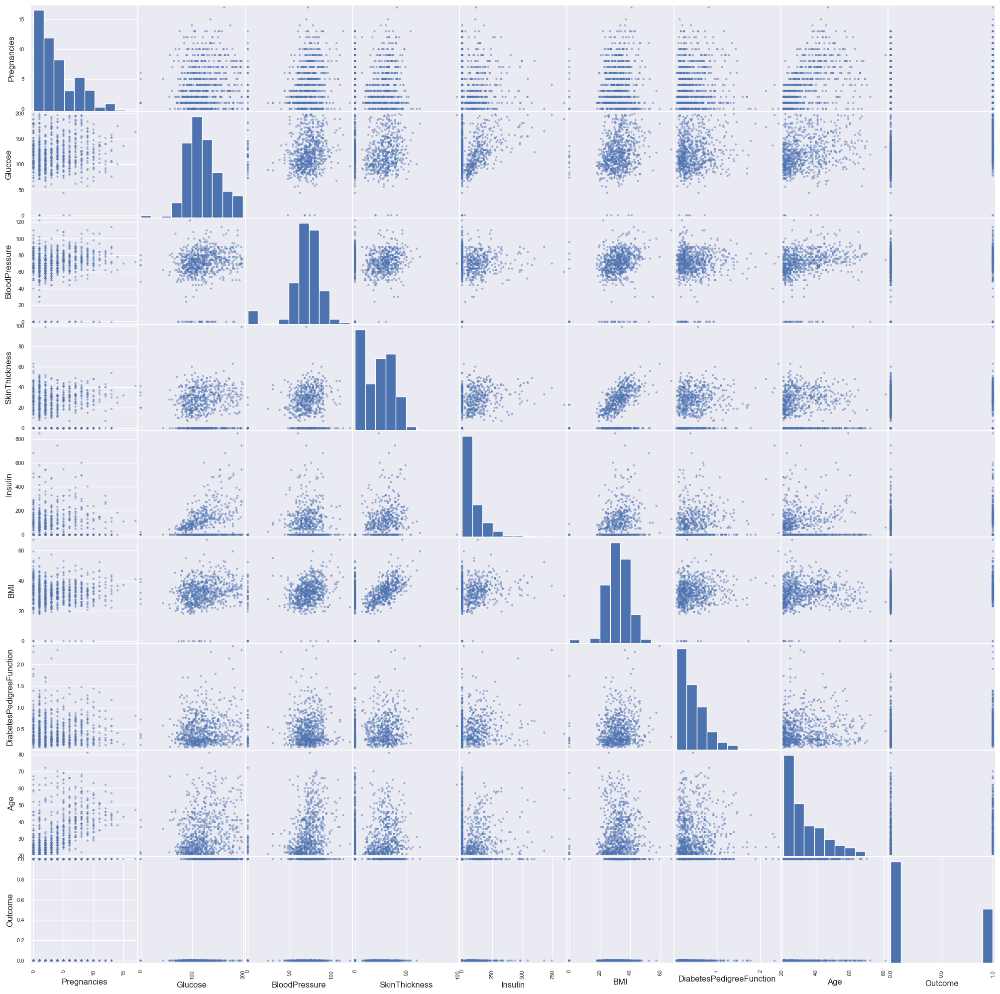

In [23]:
from pandas.plotting import scatter_matrix
p=scatter_matrix(real_data,figsize=(25, 25))

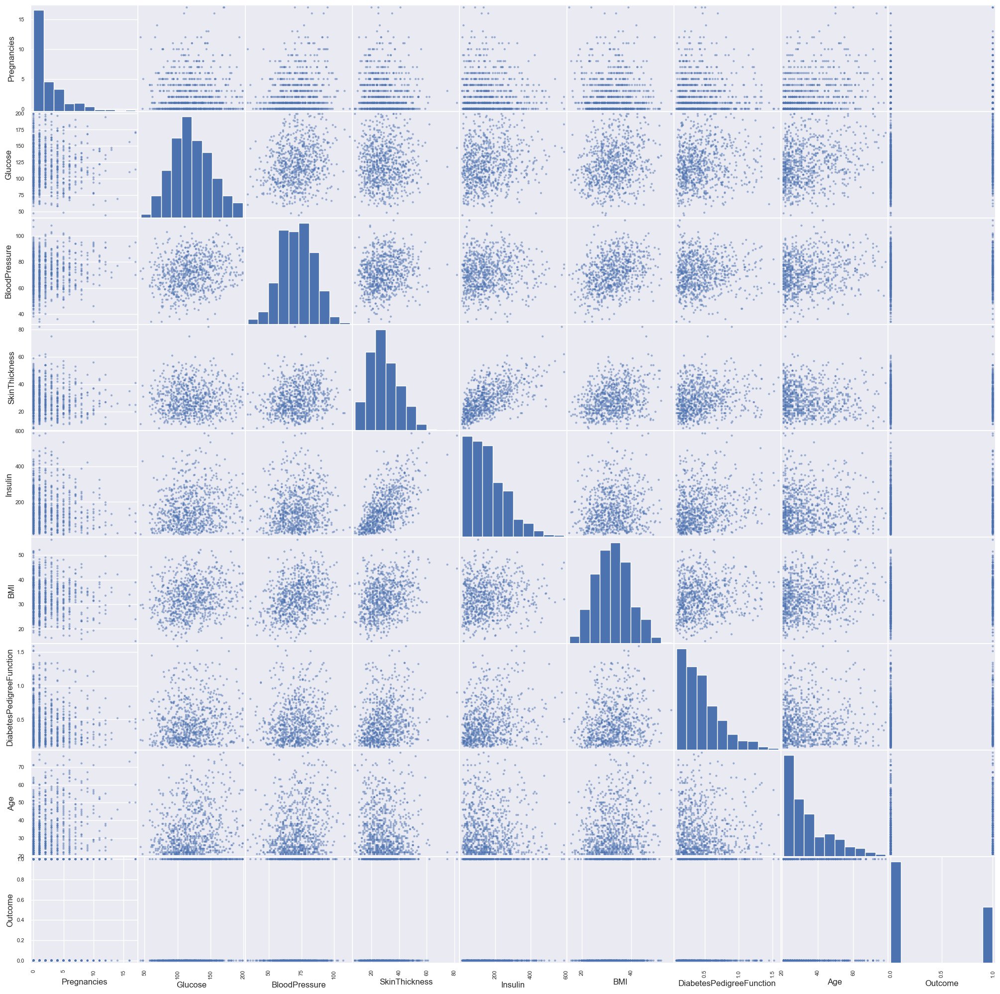

In [24]:
q=scatter_matrix(synth_data,figsize=(25, 25))

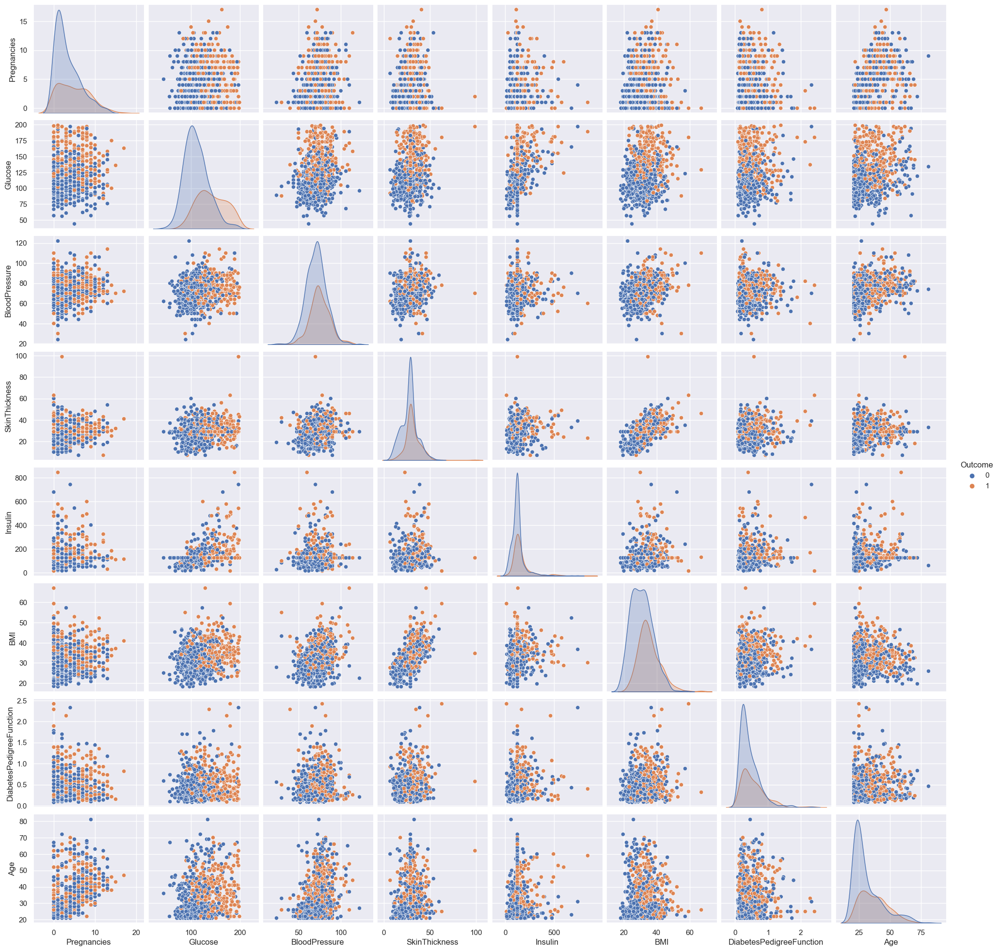

In [25]:
p=sns.pairplot(real_data_copy, hue = 'Outcome')

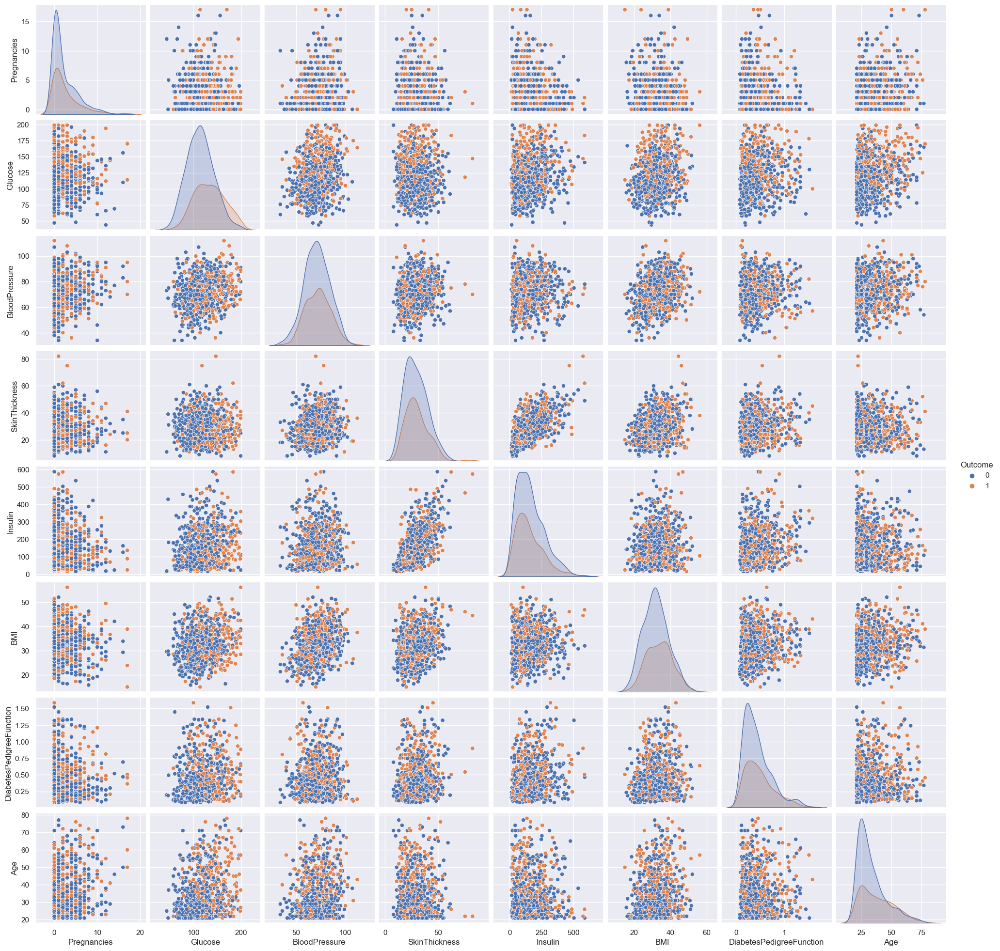

In [26]:
q=sns.pairplot(synth_data_copy, hue = 'Outcome')

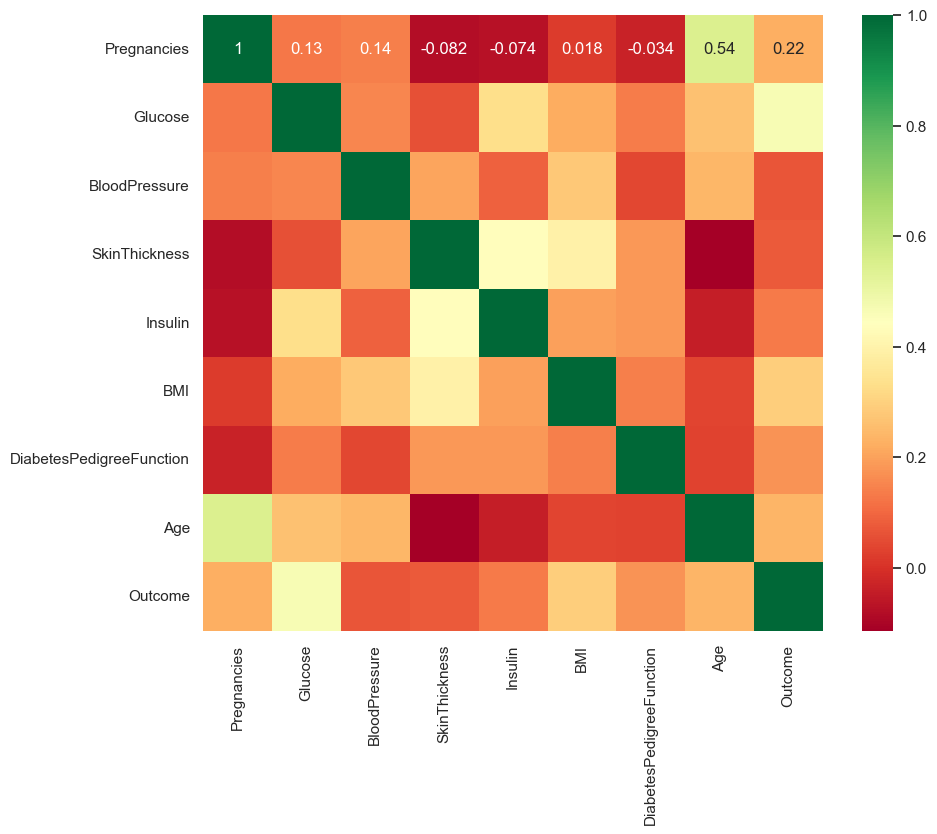

In [27]:
plt.figure(figsize=(10,8))  # on this line I just set the size of figure to 12 by 10.
p=sns.heatmap(real_data.corr(), annot=True,cmap ='RdYlGn') 

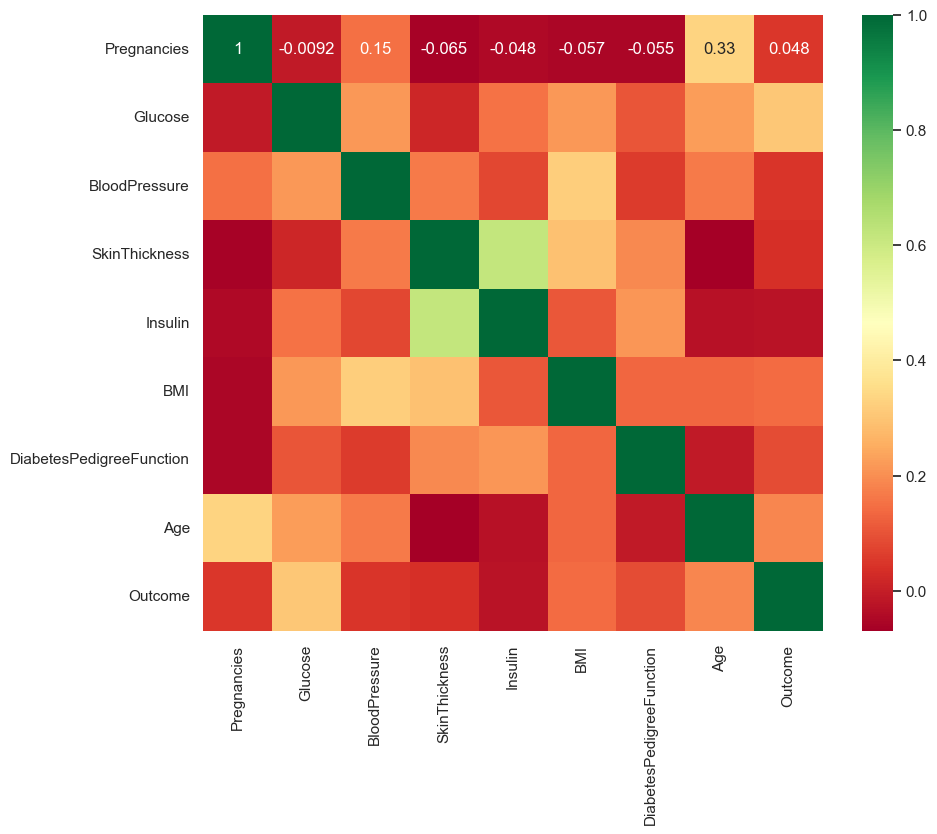

In [28]:
plt.figure(figsize=(10,8))  # on this line I just set the size of figure to 12 by 10.
q=sns.heatmap(synth_data.corr(), annot=True,cmap ='RdYlGn') 

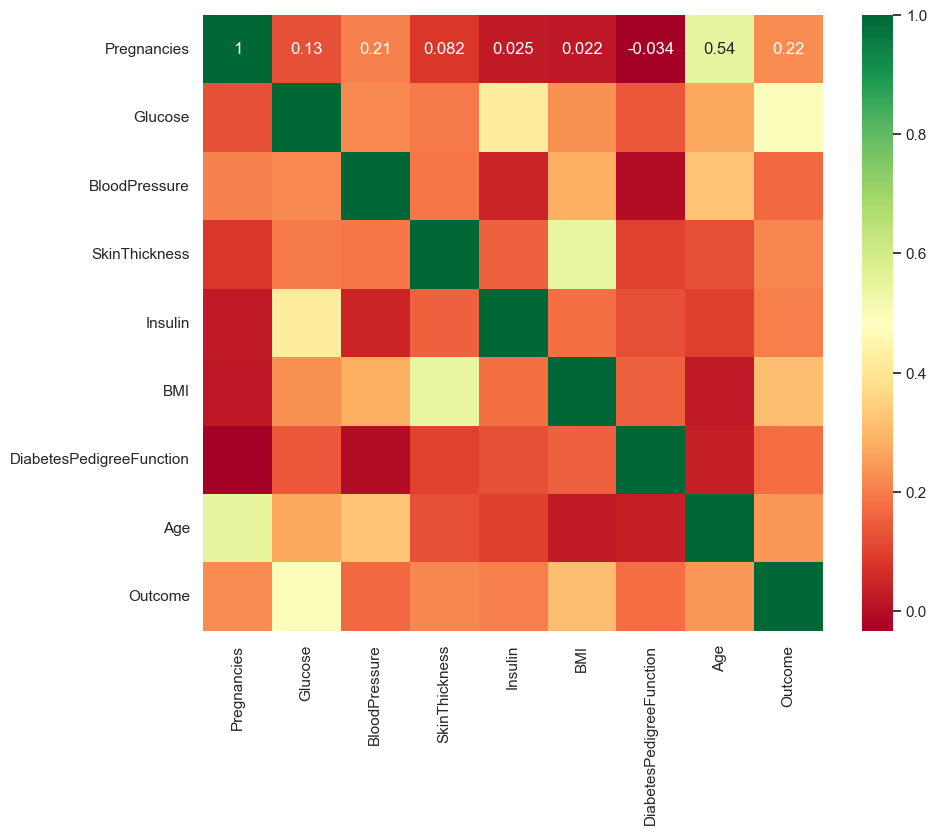

In [29]:
plt.figure(figsize=(10,8))  # on this line I just set the size of figure to 12 by 10.
p=sns.heatmap(real_data_copy.corr(), annot=True,cmap ='RdYlGn')

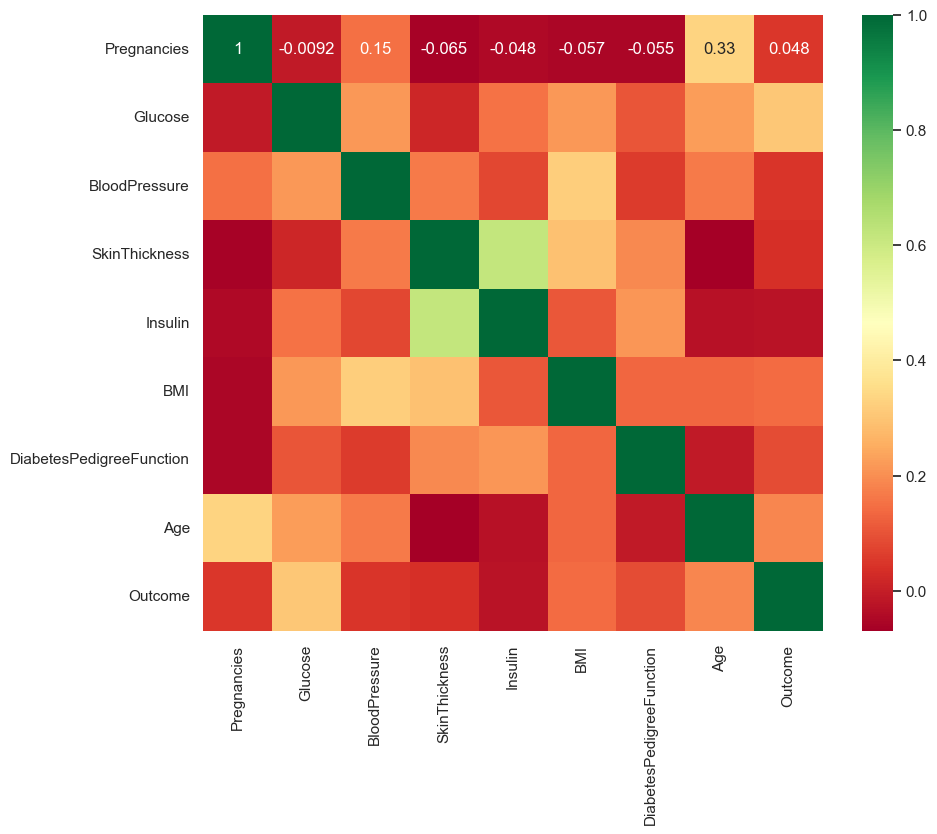

In [30]:
plt.figure(figsize=(10,8))  # on this line I just set the size of figure to 12 by 10.
q=sns.heatmap(synth_data_copy.corr(), annot=True,cmap ='RdYlGn')

In [31]:
from sklearn.preprocessing import StandardScaler
sc_X_real = StandardScaler()
X_real =  pd.DataFrame(sc_X_real.fit_transform(real_data_copy.drop(["Outcome"],axis = 1),),
        columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'])

In [32]:
X_real.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.639947,0.865108,-0.033518,0.670643,-0.181541,0.166619,0.468492,1.425995
1,-0.844885,-1.206162,-0.529859,-0.012301,-0.181541,-0.852200,-0.365061,-0.190672
2,1.233880,2.015813,-0.695306,-0.012301,-0.181541,-1.332500,0.604397,-0.105584
3,-0.844885,-1.074652,-0.529859,-0.695245,-0.540642,-0.633881,-0.920763,-1.041549
4,-1.141852,0.503458,-2.680669,0.670643,0.316566,1.549303,5.484909,-0.020496


In [33]:
sc_X_synth = StandardScaler()
X_synth =  pd.DataFrame(sc_X_synth.fit_transform(synth_data_copy.drop(["Outcome"],axis = 1),),
        columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'])

In [34]:
X_synth.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,-0.455927,-0.820995,-0.268375,-1.331186,-1.084600,-0.334440,-0.086659,0.104114
1,2.807370,-0.918534,0.277101,1.372460,0.571949,-0.192941,-0.100430,-0.053442
2,-0.455927,-0.365813,-1.671026,-0.025978,1.264518,0.486258,-1.122908,0.261670
3,-0.782256,1.227322,0.199176,-0.585353,0.075920,1.660706,-0.021248,-0.683666
4,-0.782256,0.902193,0.355026,0.160480,1.236441,-0.815540,1.297302,-0.053442


In [35]:
y_real = real_data_copy.Outcome

In [36]:
y_synth = synth_data_copy.Outcome

Max train score 100.0 % and k = [1]
Max test score 66.015625 % and k = [9]


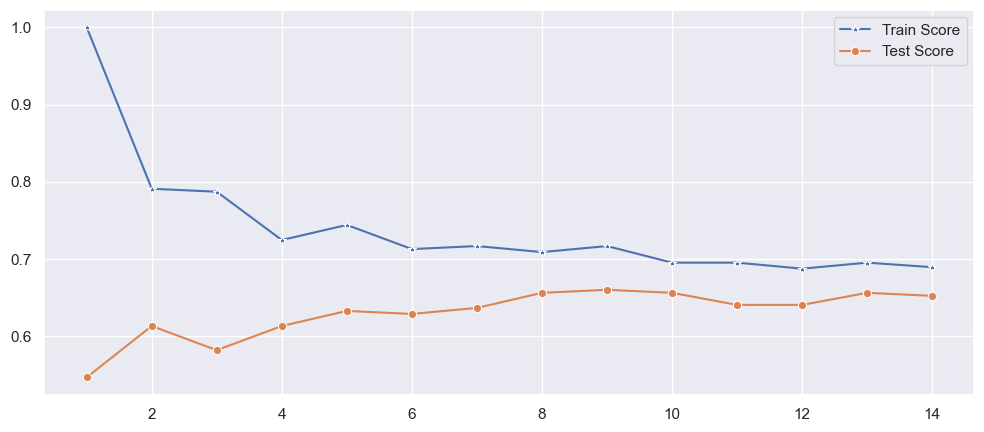

In [37]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


X_train,X_test,y_train,y_test = train_test_split(X_synth,y_synth,test_size=1/3,random_state=42, stratify=y_synth)


test_scores = []
train_scores = []

for i in range(1,15):

    knn = KNeighborsClassifier(i)
    knn.fit(X_train,y_train)
    
    train_scores.append(knn.score(X_train,y_train))
    test_scores.append(knn.score(X_test,y_test))

    ## score that comes from testing on the same datapoints that were used for training
max_train_score = max(train_scores)
train_scores_ind = [i for i, v in enumerate(train_scores) if v == max_train_score]
print('Max train score {} % and k = {}'.format(max_train_score*100,list(map(lambda x: x+1, train_scores_ind))))

## score that comes from testing on the datapoints that were split in the beginning to be used for testing solely
max_test_score = max(test_scores)
test_scores_ind = [i for i, v in enumerate(test_scores) if v == max_test_score]
print('Max test score {} % and k = {}'.format(max_test_score*100,list(map(lambda x: x+1, test_scores_ind))))

plt.figure(figsize=(12,5))
p = sns.lineplot(x=range(1,15), y=train_scores, marker='*', label='Train Score')
p = sns.lineplot(x=range(1,15), y=test_scores, marker='o', label='Test Score')

In [38]:
knn = KNeighborsClassifier(9)

knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.66015625

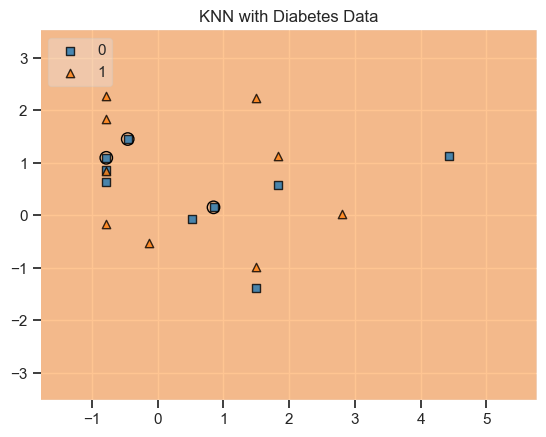

In [39]:
value = 20000
width = 20000
plot_decision_regions(X_synth.values, y_synth.values, clf=knn, legend=2, 
                      filler_feature_values={2: value, 3: value, 4: value, 5: value, 6: value, 7: value},
                      filler_feature_ranges={2: width, 3: width, 4: width, 5: width, 6: width, 7: width},
                      X_highlight=X_test.values)

# Adding axes annotations
#plt.xlabel('sepal length [cm]')
#plt.ylabel('petal length [cm]')
plt.title('KNN with Diabetes Data')
plt.show()

In [40]:
#import confusion_matrix
from sklearn.metrics import confusion_matrix
#let us get the predictions using the classifier we had fit above
y_pred = knn.predict(X_test)
confusion_matrix(y_test,y_pred)
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
True,,,
0,146,19,165
1,68,23,91
All,214,42,256


Text(0.5, 20.049999999999997, 'Predicted label')

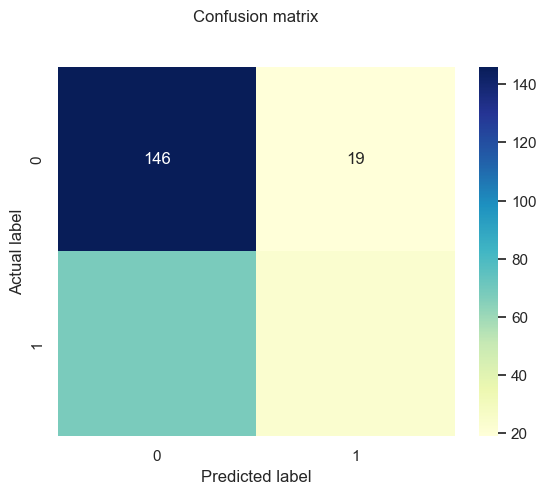

In [41]:
y_pred = knn.predict(X_test)
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [42]:
#import classification_report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.68      0.88      0.77       165
           1       0.55      0.25      0.35        91

    accuracy                           0.66       256
   macro avg       0.61      0.57      0.56       256
weighted avg       0.63      0.66      0.62       256



In [43]:
from sklearn.metrics import roc_curve
y_pred_proba = knn.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

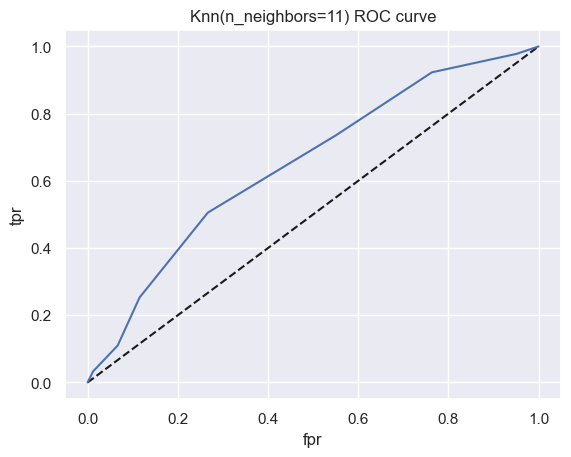

In [44]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Knn')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('Knn(n_neighbors=11) ROC curve')
plt.show()

In [45]:
#Area under ROC curve
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,y_pred_proba)

0.6497169497169497

In [46]:
#import GridSearchCV
from sklearn.model_selection import GridSearchCV
#In case of classifier like knn the parameter to be tuned is n_neighbors
param_grid = {'n_neighbors':np.arange(1,50)}
knn = KNeighborsClassifier()
knn_cv= GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X_synth,y_synth)

print("Best Score:" + str(knn_cv.best_score_))
print("Best Parameters: " + str(knn_cv.best_params_))

Best Score:0.6757915287327053
Best Parameters: {'n_neighbors': 43}


# Synthetic Data and Real Data Combination
We would like to

In [47]:
diabetes_data = pd.concat([real_data, synth_data])

diabetes_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [48]:
diabetes_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 1536 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               1536 non-null   int64  
 1   Glucose                   1536 non-null   int64  
 2   BloodPressure             1536 non-null   int64  
 3   SkinThickness             1536 non-null   int64  
 4   Insulin                   1536 non-null   int64  
 5   BMI                       1536 non-null   float64
 6   DiabetesPedigreeFunction  1536 non-null   float64
 7   Age                       1536 non-null   int64  
 8   Outcome                   1536 non-null   int64  
dtypes: float64(2), int64(7)
memory usage: 120.0 KB


In [49]:
diabetes_data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000,1536.000000
mean,3.121094,121.072917,70.274740,24.907552,120.343750,32.328060,0.463024,33.959635,0.352865
std,3.300920,31.370787,16.460991,14.277129,118.292864,7.494061,0.311683,12.257378,0.478017
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,17.000000,18.000000,27.400000,0.235750,24.000000,0.000000
50%,2.000000,118.000000,72.000000,26.000000,96.500000,32.200000,0.381000,30.000000,0.000000
75%,5.000000,141.000000,80.000000,34.000000,179.250000,37.100000,0.614000,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [50]:
diabetes_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,1536.0,3.121094,3.300920,0.000,1.00000,2.000,5.000,17.00
Glucose,1536.0,121.072917,31.370787,0.000,99.00000,118.000,141.000,199.00
BloodPressure,1536.0,70.274740,16.460991,0.000,62.00000,72.000,80.000,122.00
SkinThickness,1536.0,24.907552,14.277129,0.000,17.00000,26.000,34.000,99.00
Insulin,1536.0,120.343750,118.292864,0.000,18.00000,96.500,179.250,846.00
BMI,1536.0,32.328060,7.494061,0.000,27.40000,32.200,37.100,67.10
DiabetesPedigreeFunction,1536.0,0.463024,0.311683,0.078,0.23575,0.381,0.614,2.42
Age,1536.0,33.959635,12.257378,21.000,24.00000,30.000,41.000,81.00
Outcome,1536.0,0.352865,0.478017,0.000,0.00000,0.000,1.000,1.00


In [51]:
diabetes_data_copy = diabetes_data.copy(deep = True)
diabetes_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = diabetes_data_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

## showing the count of Nans
print(diabetes_data_copy.isnull().sum())

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64


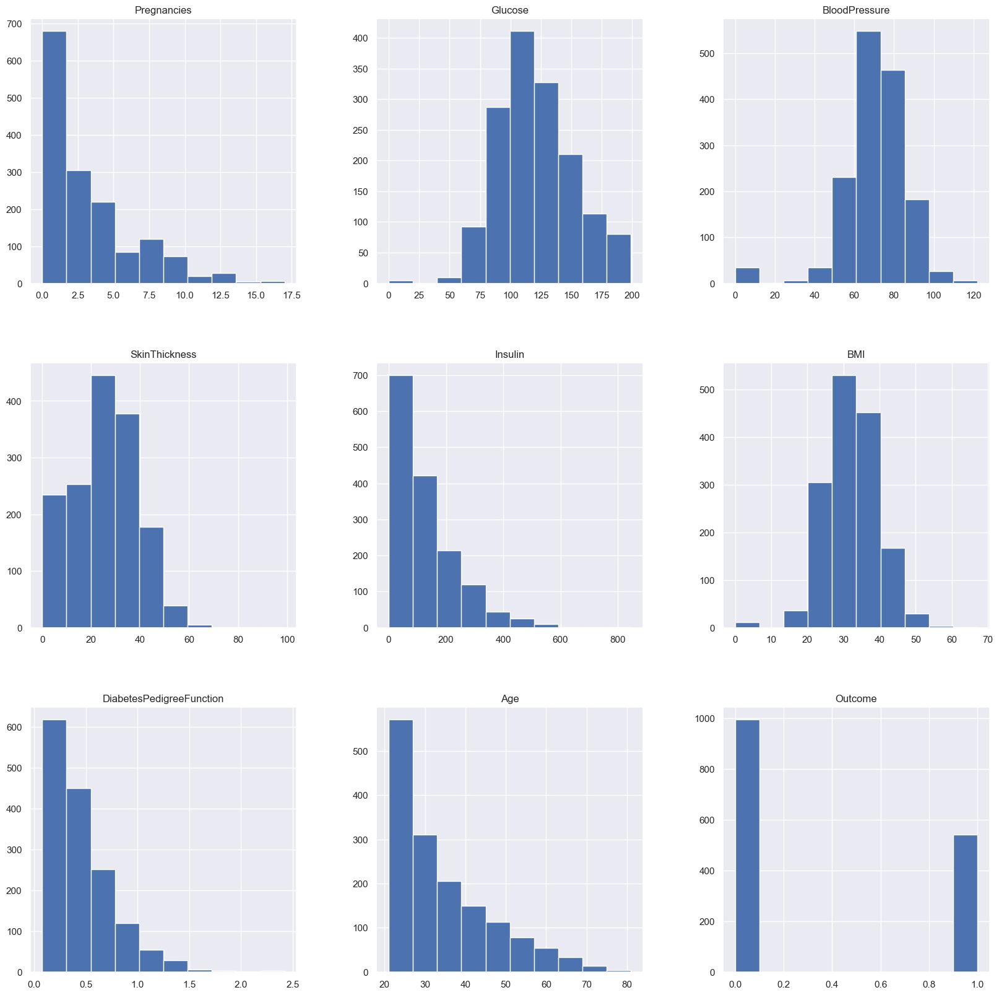

In [52]:
p = diabetes_data.hist(figsize = (20,20))

In [53]:
diabetes_data_copy['Glucose'].fillna(diabetes_data_copy['Glucose'].mean(), inplace = True)
diabetes_data_copy['BloodPressure'].fillna(diabetes_data_copy['BloodPressure'].mean(), inplace = True)
diabetes_data_copy['SkinThickness'].fillna(diabetes_data_copy['SkinThickness'].median(), inplace = True)
diabetes_data_copy['Insulin'].fillna(diabetes_data_copy['Insulin'].median(), inplace = True)
diabetes_data_copy['BMI'].fillna(diabetes_data_copy['BMI'].median(), inplace = True)

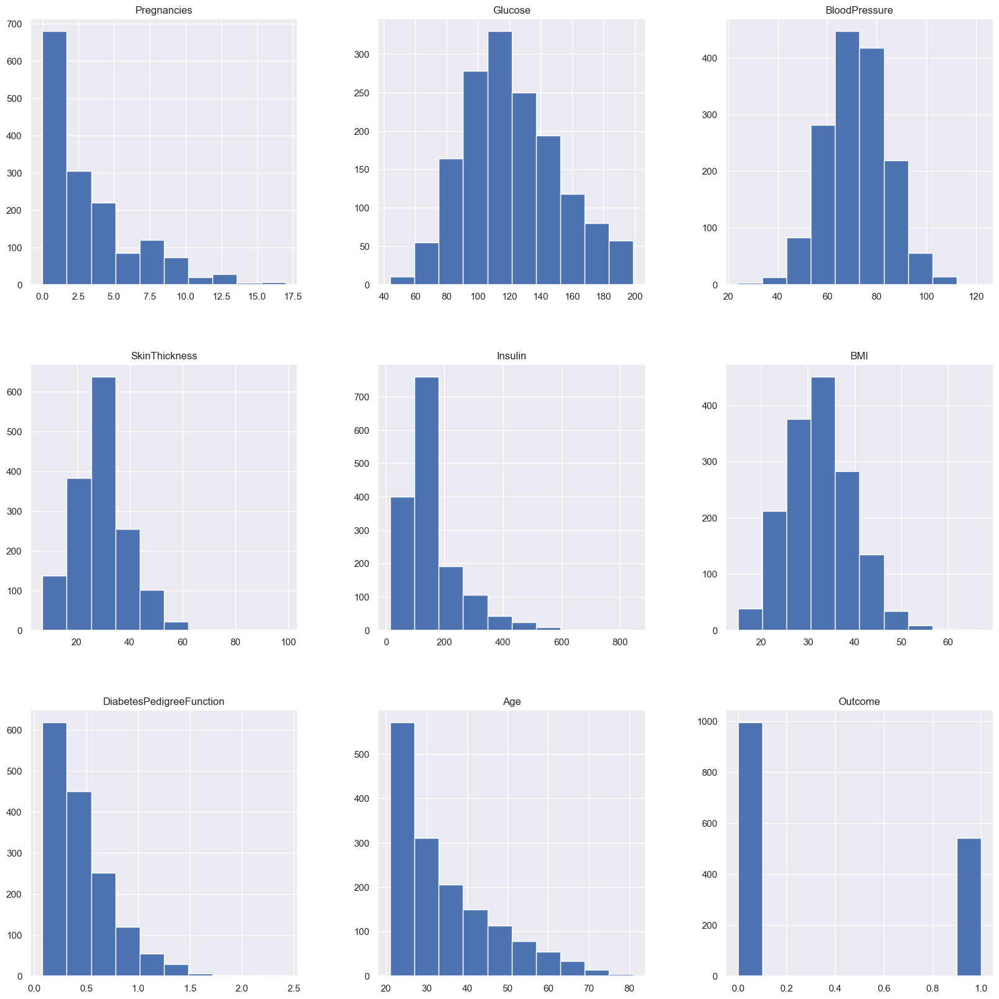

In [54]:
p = diabetes_data_copy.hist(figsize = (20,20))

In [55]:
## observing the shape of the data
diabetes_data.shape

(1536, 9)

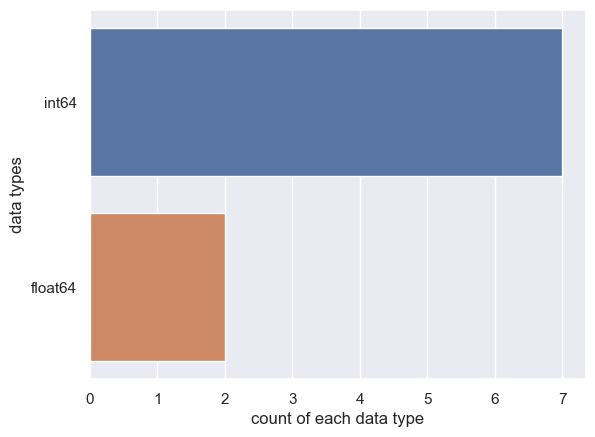

In [56]:
sns.countplot(y=diabetes_data.dtypes ,data=diabetes_data)
plt.xlabel("count of each data type")
plt.ylabel("data types")
plt.show()

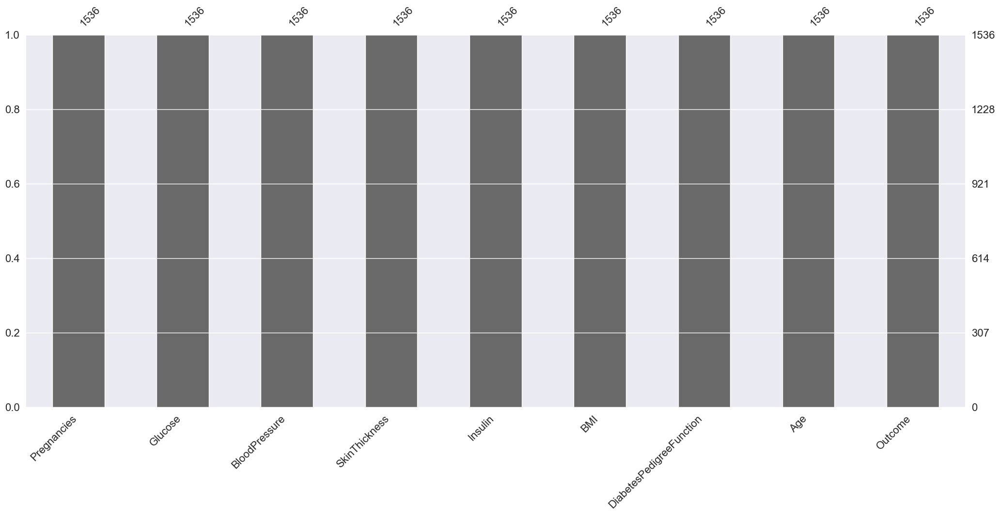

In [57]:
import missingno as msno
p=msno.bar(diabetes_data)

Outcome
0    994
1    542
Name: count, dtype: int64


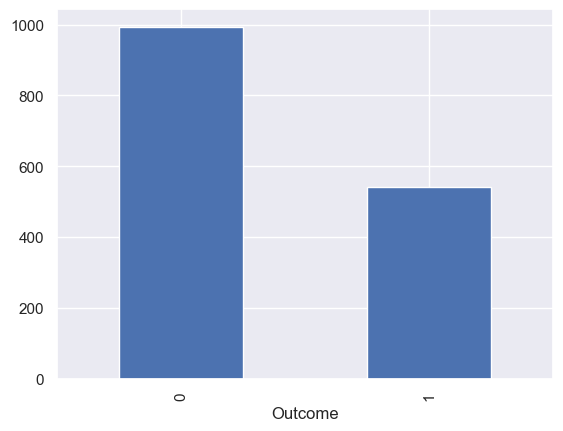

In [58]:
## checking the balance of the data by plotting the count of outcomes by their value
color_wheel = {1: "#0392cf", 
               2: "#7bc043"}
colors = diabetes_data["Outcome"].map(lambda x: color_wheel.get(x + 1))
print(diabetes_data.Outcome.value_counts())
p=diabetes_data.Outcome.value_counts().plot(kind="bar")

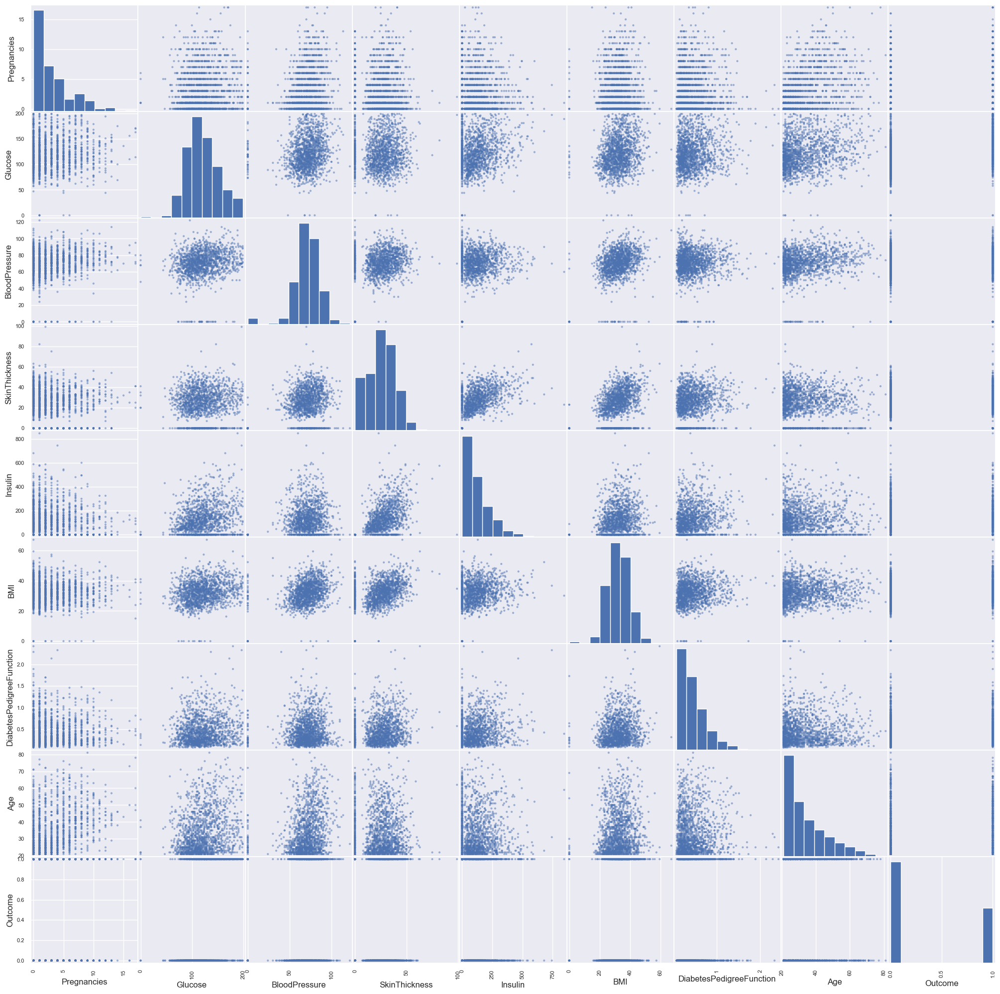

In [59]:
from pandas.plotting import scatter_matrix
p=scatter_matrix(diabetes_data,figsize=(25, 25))

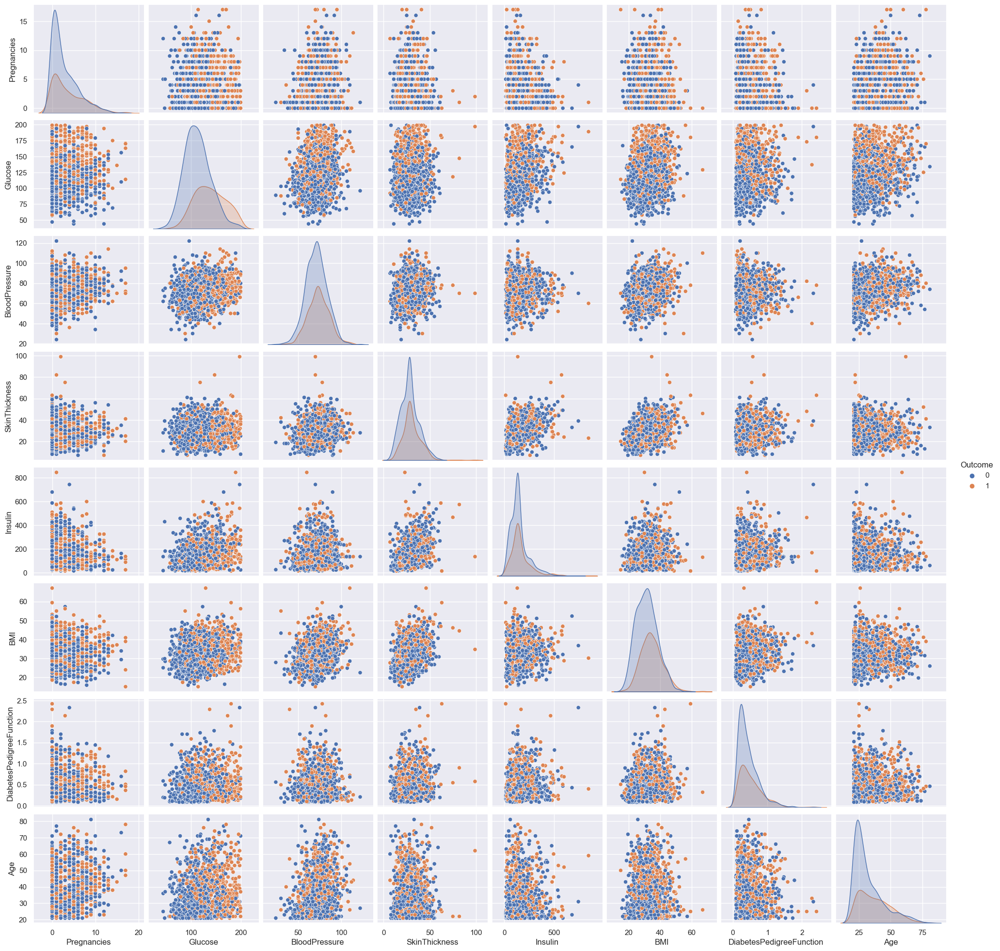

In [60]:
p=sns.pairplot(diabetes_data_copy, hue = 'Outcome')

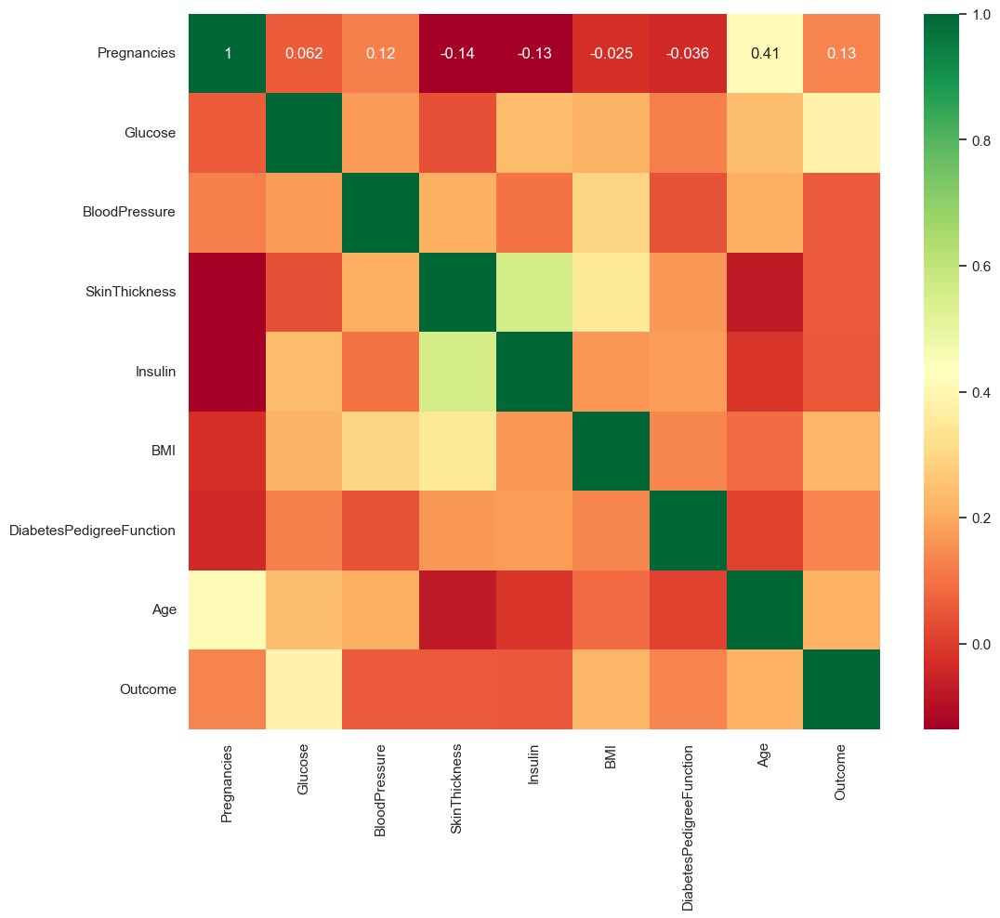

In [61]:
plt.figure(figsize=(12,10))  # on this line I just set the size of figure to 12 by 10.
p=sns.heatmap(diabetes_data.corr(), annot=True,cmap ='RdYlGn')  # seaborn has very simple solution for heatmap

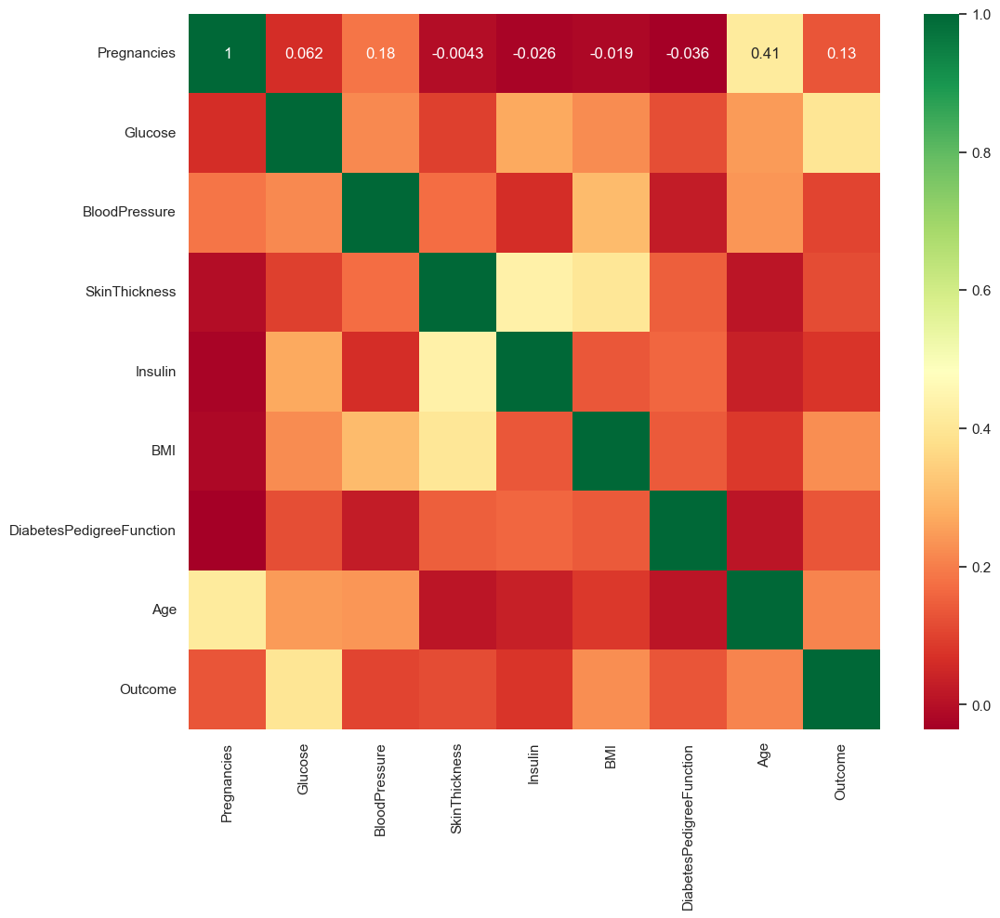

In [62]:
plt.figure(figsize=(12,10))  # on this line I just set the size of figure to 12 by 10.
p=sns.heatmap(diabetes_data_copy.corr(), annot=True,cmap ='RdYlGn')  # seaborn has very simple solution for heatmap

In [63]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X =  pd.DataFrame(sc_X.fit_transform(diabetes_data_copy.drop(["Outcome"],axis = 1),),
        columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'])

In [64]:
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.872437,0.867394,0.006942,0.606745,-0.187577,0.149292,0.526270,1.309056
1,-0.642786,-1.192251,-0.474010,-0.004644,-0.187577,-0.854955,-0.359534,-0.241536
2,1.478526,2.011642,-0.634327,-0.106542,-0.187577,-1.328386,0.670695,-0.159926
3,-0.642786,-1.061480,-0.474010,-0.616033,-0.609798,-0.639759,-0.950071,-1.057637
4,-0.945830,0.507774,-2.558135,0.606745,0.152258,1.512199,5.857145,-0.078316


In [65]:
y = diabetes_data_copy.Outcome

In [66]:
#importing train_test_split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=1/3,random_state=42, stratify=y)

In [67]:
from sklearn.neighbors import KNeighborsClassifier


test_scores = []
train_scores = []

for i in range(1,15):

    knn = KNeighborsClassifier(i)
    knn.fit(X_train,y_train)
    
    train_scores.append(knn.score(X_train,y_train))
    test_scores.append(knn.score(X_test,y_test))

In [68]:
## score that comes from testing on the same datapoints that were used for training
max_train_score = max(train_scores)
train_scores_ind = [i for i, v in enumerate(train_scores) if v == max_train_score]
print('Max train score {} % and k = {}'.format(max_train_score*100,list(map(lambda x: x+1, train_scores_ind))))

Max train score 100.0 % and k = [1]


In [69]:
## score that comes from testing on the datapoints that were split in the beginning to be used for testing solely
max_test_score = max(test_scores)
test_scores_ind = [i for i, v in enumerate(test_scores) if v == max_test_score]
print('Max test score {} % and k = {}'.format(max_test_score*100,list(map(lambda x: x+1, test_scores_ind))))

Max test score 73.6328125 % and k = [14]


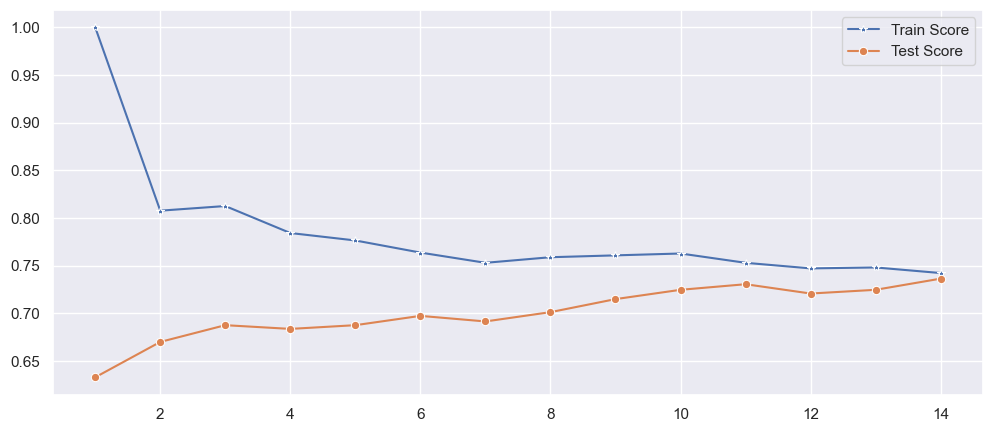

In [70]:
plt.figure(figsize=(12,5))
p = sns.lineplot(x=range(1,15), y=train_scores, marker='*', label='Train Score')
p = sns.lineplot(x=range(1,15), y=test_scores, marker='o', label='Test Score')

In [71]:
#Setup a knn classifier with k neighbors
knn = KNeighborsClassifier(14)

knn.fit(X_train,y_train)
knn.score(X_test,y_test)

0.736328125

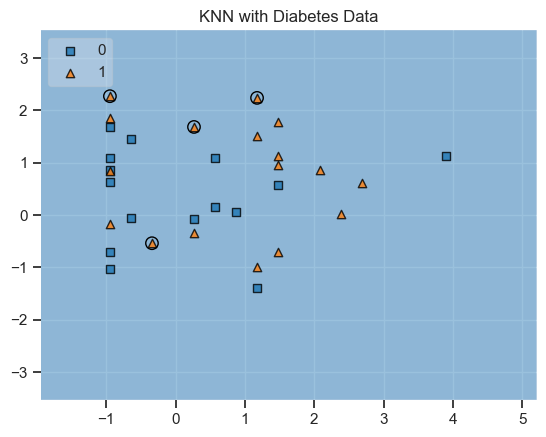

In [72]:
value = 20000
width = 20000
plot_decision_regions(X.values, y.values, clf=knn, legend=2, 
                      filler_feature_values={2: value, 3: value, 4: value, 5: value, 6: value, 7: value},
                      filler_feature_ranges={2: width, 3: width, 4: width, 5: width, 6: width, 7: width},
                      X_highlight=X_test.values)

# Adding axes annotations
#plt.xlabel('sepal length [cm]')
#plt.ylabel('petal length [cm]')
plt.title('KNN with Diabetes Data')
plt.show()

In [73]:
#import confusion_matrix
from sklearn.metrics import confusion_matrix
#let us get the predictions using the classifier we had fit above
y_pred = knn.predict(X_test)
confusion_matrix(y_test,y_pred)
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
True,,,
0,298,33,331
1,102,79,181
All,400,112,512


Text(0.5, 20.049999999999997, 'Predicted label')

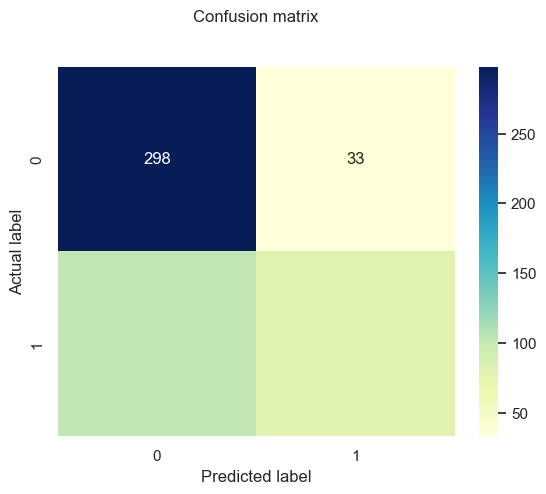

In [74]:
y_pred = knn.predict(X_test)
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [75]:
#import classification_report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.74      0.90      0.82       331
           1       0.71      0.44      0.54       181

    accuracy                           0.74       512
   macro avg       0.73      0.67      0.68       512
weighted avg       0.73      0.74      0.72       512



In [76]:
from sklearn.metrics import roc_curve
y_pred_proba = knn.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

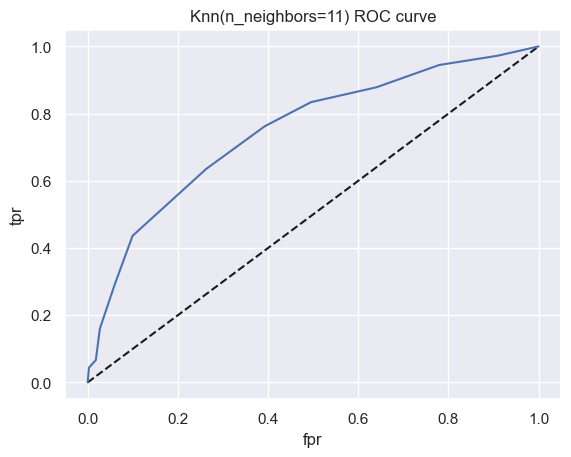

In [77]:
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Knn')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('Knn(n_neighbors=11) ROC curve')
plt.show()

In [78]:
#Area under ROC curve
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,y_pred_proba)

0.7487856987865333

In [79]:
#import GridSearchCV
from sklearn.model_selection import GridSearchCV
#In case of classifier like knn the parameter to be tuned is n_neighbors
param_grid = {'n_neighbors':np.arange(1,50)}
knn = KNeighborsClassifier()
knn_cv= GridSearchCV(knn,param_grid,cv=5)
knn_cv.fit(X,y)

print("Best Score:" + str(knn_cv.best_score_))
print("Best Parameters: " + str(knn_cv.best_params_))

Best Score:0.71221286856466
Best Parameters: {'n_neighbors': 31}


Better than the 'only' synthetic data. Which is good maybe we would like to refine the model of synthetic data generation.